In [1]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import hydrodataset

In [42]:
pip install google-cloud-audit-log==0.2.4

Note: you may need to restart the kernel to use updated packages.


In [2]:
import hydrodataset
import os
from hydrodataset.camels import Camels
camels = Camels(data_path=os.path.join("camels", "camels_us"), download=True, region="US")
gage_ids = camels.read_object_ids()

In [1545]:
def getData(start_date,end_date,index):
    #dayl_l= camels.read_relevant_cols(gage_ids[index:index+1], [start_date, end_date],var_lst=["dayl"]).ravel()
    prcp_l= camels.read_relevant_cols(gage_ids[index:index+1], [start_date, end_date],var_lst=["prcp"]).ravel()
    srad_l= camels.read_relevant_cols(gage_ids[index:index+1], [start_date, end_date],var_lst=["srad"]).ravel()
    #swe_l= camels.read_relevant_cols(gage_ids[index:index+1], [start_date, end_date],var_lst=["swe"]).ravel()
    tmax_l= camels.read_relevant_cols(gage_ids[index:index+1], [start_date, end_date],var_lst=["tmax"]).ravel()
    tmin_l= camels.read_relevant_cols(gage_ids[index:index+1], [start_date, end_date], var_lst=["tmin"]).ravel()
    vp_l= camels.read_relevant_cols( gage_ids[index:index+1], [start_date, end_date],var_lst=["vp"]).ravel()
    streamflow_l= camels.read_target_cols(gage_ids[index:index+1], [start_date,end_date], target_cols=["usgsFlow"]).ravel()
    
    #dayL = pd.DataFrame(dayl_l,columns=["dayl"])
    prcpL = pd.DataFrame(prcp_l,columns=["prcp"])
    sradL = pd.DataFrame(srad_l,columns=["srad"])
    #sweL = pd.DataFrame(swe_l,columns=["swe"])
    tmaxL = pd.DataFrame(tmax_l,columns=["tmax"])
    tminL = pd.DataFrame(tmin_l,columns=["tmin"])
    vpL = pd.DataFrame(vp_l,columns=["vpl"])
    streamflowL = pd.DataFrame(streamflow_l,columns=["streamflow"])
    
    dynamicData = pd.concat([prcpL,sradL,tmaxL,tminL,streamflowL],axis=1)
    
    dynamicData = dynamicData.dropna()
    
    gauge_lat = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['gauge_lat']).ravel()
    gauge_lon = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['gauge_lon']).ravel()
    elev_mean = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['elev_mean']).ravel()
    slope_mean = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['slope_mean']).ravel()
    area_geospa_fabric = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['area_geospa_fabric']).ravel()
    area_gages2 = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['area_gages2']).ravel()
    p_mean = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['p_mean']).ravel()
    pet_mean = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['pet_mean']).ravel()
    p_seasonality = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['p_seasonality']).ravel()
    frac_snow = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['frac_snow']).ravel()
    aridity = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['aridity']).ravel()
    high_prec_freq = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['high_prec_freq']).ravel()
    high_prec_dur = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['high_prec_dur']).ravel()
    high_prec_timing = camels.read_constant_cols(gage_ids[index:index+1], var_lst=['high_prec_timing']).ravel()
    low_prec_freq = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['low_prec_freq']
    ).ravel()
    low_prec_dur = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['low_prec_dur']
    ).ravel()
    low_prec_timing = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['low_prec_timing']
    ).ravel()
    frac_forest = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['frac_forest']
    ).ravel()
    lai_max = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['lai_max']
    ).ravel()
    lai_diff = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['lai_diff']
    ).ravel()
    gvf_max = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['gvf_max']
    ).ravel()
    gvf_diff = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['gvf_diff']
    ).ravel()
    dom_land_cover_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['dom_land_cover_frac']
    ).ravel()
    dom_land_cover = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['dom_land_cover']
    ).ravel()
    root_depth_50 = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['root_depth_50']
    ).ravel()
    root_depth_99 = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['root_depth_99']
    ).ravel()
    soil_depth_pelletier = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['soil_depth_pelletier']
    ).ravel()
    soil_depth_statsgo = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['soil_depth_statsgo']
    ).ravel()
    soil_porosity = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['soil_porosity']
    ).ravel()
    soil_conductivity = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['soil_conductivity']
    ).ravel()

    max_water_content = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['max_water_content']
    ).ravel()
    sand_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['sand_frac']
    ).ravel()
    silt_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['silt_frac']
    ).ravel()
    clay_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['clay_frac']
    ).ravel()
    water_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['water_frac']
    ).ravel()
    organic_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['organic_frac']
    ).ravel()
    other_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['other_frac']
    ).ravel()
    geol_1st_class = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['geol_1st_class']
    ).ravel()
    glim_1st_class_frac = camels.read_constant_cols(
        gage_ids[index:index+1], var_lst=['glim_1st_class_frac']
    ).ravel()
    geol_2nd_class = camels.read_constant_cols(
         gage_ids[index:index+1], var_lst=['geol_2nd_class']
    ).ravel()
    glim_2nd_class_frac = camels.read_constant_cols(
         gage_ids[index:index+1], var_lst=['glim_2nd_class_frac']
    ).ravel()
    carbonate_rocks_frac = camels.read_constant_cols(
         gage_ids[index:index+1], var_lst=['carbonate_rocks_frac']
    ).ravel()
    geol_porostiy = camels.read_constant_cols(
         gage_ids[index:index+1], var_lst=['geol_porostiy']
    ).ravel()
    geol_permeability = camels.read_constant_cols(
         gage_ids[index:index+1], var_lst=['geol_permeability']
    ).ravel()
    
    final_data = {
    'gauge_lat':gauge_lat,
   'gauge_lon': gauge_lon,
    'elev_mean': elev_mean,
    'slope_mean':slope_mean ,
    'area_gages2': area_gages2,
    'area_geospa_fabric':area_geospa_fabric,
    'p_mean':p_mean,
    'pet_mean': pet_mean,
    'p_seasonality':p_seasonality ,
    'frac_snow':frac_snow,
    'aridity': aridity,
    'high_prec_freq':high_prec_freq, 
    'high_prec_dur':high_prec_dur,
    'high_prec_timing':high_prec_timing,
    'low_prec_freq':low_prec_freq,
    'low_prec_dur':low_prec_dur , 
    'low_prec_timing':low_prec_timing,
    'frac_forest':frac_forest,
    'lai_max':lai_max,
    'lai_diff':lai_diff,
    'gvf_max':gvf_max,
    'gvf_diff':gvf_diff,
    'dom_land_cover_frac':dom_land_cover_frac,
    'dom_land_cover':dom_land_cover ,
    'root_depth_50':root_depth_50,
    'root_depth_99':root_depth_99,
    'soil_depth_pelletier':soil_depth_pelletier ,
    'soil_depth_statsgo':soil_depth_statsgo,
    'soil_porosity':soil_porosity,
    'soil_conductivity':soil_conductivity ,
    'max_water_content':max_water_content, 
    'sand_frac':sand_frac, 
    'silt_frac':silt_frac,
    'clay_frac':clay_frac,
    'water_frac':water_frac,
    'organic_frac':organic_frac,
    'other_frac':other_frac,
    'geol_1st_class': geol_1st_class,
    'glim_1st_class_frac': glim_1st_class_frac,
    'geol_2nd_class': geol_2nd_class,
    'glim_2nd_class_frac': geol_2nd_class,
    'carbonate_rocks_frac': carbonate_rocks_frac,
    'geol_porostiy':geol_porostiy, 
    'geol_permeability': geol_permeability
    
}

    staticData = pd.DataFrame(final_data,columns=['elev_mean', 'slope_mean', 'area_gages2',
                                               'pet_mean' ,'p_seasonality' ,'frac_snow',
    'aridity' ,'high_prec_freq', 'high_prec_dur',
    'low_prec_freq', 'low_prec_dur', 'frac_forest','lai_max','lai_diff',
     'dom_land_cover_frac', 'dom_land_cover' ,'root_depth_50','root_depth_99','soil_porosity',
    'soil_conductivity' ,'max_water_content', 'sand_frac', 'silt_frac',
    'clay_frac','water_frac','organic_frac','other_frac'])
    df_final = pd.concat([dynamicData,staticData],axis=1,sort=False)
    for i in range(dynamicData.shape[1],df_final.shape[1]):
    	df_final.iloc[1:,i] = df_final.iloc[:1,i][0]
    #df_final = df_final.drop(['root_depth_50','root_depth_99'],axis=1)
    #df_final = df_final.loc[:, (df_final != 0).any(axis=0)]
    print(index)
    return df_final
      

In [1546]:
df = getData("1980-01-01", "2014-09-30",1)
for i in range(2,12):
    if i != 25 and i!=50 and i!= 75 and i!=100 and i!=125 and i!=150 and i!=175 and i!=200 and i!=225 and i!=250 and i!=275 and i!=300:
        df_temp = getData("1980-01-01", "2014-09-30",i)
        df = df.append(df_temp, ignore_index = True)

Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

1


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

2


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

3


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

4


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

5


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

6


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

7


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

8


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

9


Read forcing data of CAMELS-US:   0%|                                                            | 0/1 [00:00<?, ?it/s]

10


Read streamflow data of CAMELS-US: 100%|█████████████████████████████████████████████████| 1/1 [00:00<00:00, 24.46it/s]


11


In [1547]:
df.head(10)

,prcp,srad,tmax,tmin,streamflow,elev_mean,slope_mean,area_gages2,pet_mean,p_seasonality,...,root_depth_99,soil_porosity,soil_conductivity,max_water_content,sand_frac,silt_frac,clay_frac,water_frac,organic_frac,other_frac
0,0.00,178.46,-0.72,-10.59,395.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
1,0.00,186.36,0.74,-9.82,350.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
2,0.00,198.93,-0.65,-12.28,310.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
3,0.00,182.99,-5.35,-15.20,275.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
4,0.00,155.25,-7.15,-14.94,250.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
5,0.00,181.29,-6.47,-15.98,230.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
6,0.00,238.55,1.63,-16.92,230.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
7,2.05,195.85,4.41,-7.50,270.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
8,0.00,182.97,0.00,-9.52,240.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472
9,0.00,211.94,-2.74,-14.61,220.0,92.68,17.79072,573.6,2.119256,-0.11453,...,2.238444,0.415905,2.375005,0.626229,59.390156,28.080937,12.037646,1.226913,0.0,0.358472


In [1548]:
df = df.dropna()

In [1549]:
from sklearn.preprocessing import StandardScaler

In [1550]:
df1 = df
df2= df1
df2_train = df2
df2_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 126454 entries, 0 to 139144
Data columns (total 32 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   prcp                 126454 non-null  float64
 1   srad                 126454 non-null  float64
 2   tmax                 126454 non-null  float64
 3   tmin                 126454 non-null  float64
 4   streamflow           126454 non-null  float64
 5   elev_mean            126454 non-null  float64
 6   slope_mean           126454 non-null  float64
 7   area_gages2          126454 non-null  float64
 8   pet_mean             126454 non-null  float64
 9   p_seasonality        126454 non-null  float64
 10  frac_snow            126454 non-null  float64
 11  aridity              126454 non-null  float64
 12  high_prec_freq       126454 non-null  float64
 13  high_prec_dur        126454 non-null  float64
 14  low_prec_freq        126454 non-null  float64
 15  low_prec_dur     

In [1551]:
df.shape

(126454, 32)

In [1552]:
sc = StandardScaler()
df2_temp = df2_train.drop(['streamflow'],axis=1)
df2_train_scaled = sc.fit_transform(df2_temp)
df2_train_scaled

array([[-0.47164046, -1.00362787, -1.10266115, ...,  2.58754366,
         0.        , -0.46613424],
       [-0.47164046, -0.94622567, -0.97167529, ...,  2.58754366,
         0.        , -0.46613424],
       [-0.47164046, -0.85489079, -1.096381  , ...,  2.58754366,
         0.        , -0.46613424],
       ...,
       [-0.47164046,  0.46761224,  0.88904166, ..., -0.4766032 ,
         0.        ,  0.05995969],
       [-0.47164046,  0.35774879,  0.72396359, ..., -0.4766032 ,
         0.        ,  0.05995969],
       [-0.47164046,  0.12690477,  0.76613027, ..., -0.4766032 ,
         0.        ,  0.05995969]])

In [1553]:
sc2 = StandardScaler()
df2_train_scaled_y = sc2.fit_transform(df2_train[['streamflow']])
df2_train_scaled_y

array([[ 0.13251264],
       [ 0.06495268],
       [ 0.00489939],
       ...,
       [-0.45902732],
       [-0.45941766],
       [-0.45947772]])

In [1554]:
look_back = 1
train_size = df.shape[0]
X_train = []
y_train = []
for i in range(look_back,train_size):
    X_train.append(df2_train_scaled[i-look_back:i])
    y_train.append(df2_train_scaled_y[i][0])
X_train,y_train = np.array(X_train),np.array(y_train)

In [1555]:
X_train_shape = np.reshape(X_train,(X_train.shape[0],X_train.shape[1],X_train.shape[2]))

In [1556]:
X_train_shape.shape[2]

31

In [1557]:
from keras.models import Sequential
from keras.layers import Dense,LSTM,Dropout

In [1558]:
model = Sequential()
model.add(LSTM(units=128,return_sequences=True,input_shape=(look_back,X_train_shape.shape[2])))
model.add(Dropout(0.2))
model.add(LSTM(units=64))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(optimizer='adam',loss='mean_squared_error')

In [1559]:
model.fit(X_train_shape,y_train,epochs=5,batch_size=100)

Epoch 1/5
1265/1265 [==============================] - 9s 5ms/step - loss: 0.6400
Epoch 2/5
1265/1265 [==============================] - 6s 4ms/step - loss: 0.5937
Epoch 3/5
1265/1265 [==============================] - 5s 4ms/step - loss: 0.5817
Epoch 4/5
1265/1265 [==============================] - 5s 4ms/step - loss: 0.5822
Epoch 5/5
1265/1265 [==============================] - 5s 4ms/step - loss: 0.5772


In [1560]:
df2_test = getData("1980-01-01", "2014-09-30",15)
df2_test.head()

Read streamflow data of CAMELS-US: 100%|█████████████████████████████████████████████████| 1/1 [00:00<00:00, 27.82it/s]


15


,prcp,srad,tmax,tmin,streamflow,elev_mean,slope_mean,area_gages2,pet_mean,p_seasonality,...,root_depth_99,soil_porosity,soil_conductivity,max_water_content,sand_frac,silt_frac,clay_frac,water_frac,organic_frac,other_frac
0,0.0,115.50,-6.82,-11.50,74.0,784.85,110.13062,228.55,2.144046,0.171648,...,2.364644,0.419819,2.77769,0.475732,53.800583,30.326244,8.728079,0.0,0.0,7.108573
1,0.0,72.71,-5.28,-7.63,70.0,784.85,110.13062,228.55,2.144046,0.171648,...,2.364644,0.419819,2.77769,0.475732,53.800583,30.326244,8.728079,0.0,0.0,7.108573
2,0.0,221.33,-1.64,-12.65,66.0,784.85,110.13062,228.55,2.144046,0.171648,...,2.364644,0.419819,2.77769,0.475732,53.800583,30.326244,8.728079,0.0,0.0,7.108573
3,0.0,177.49,-11.89,-19.55,64.0,784.85,110.13062,228.55,2.144046,0.171648,...,2.364644,0.419819,2.77769,0.475732,53.800583,30.326244,8.728079,0.0,0.0,7.108573
4,0.0,203.86,-9.15,-18.42,68.0,784.85,110.13062,228.55,2.144046,0.171648,...,2.364644,0.419819,2.77769,0.475732,53.800583,30.326244,8.728079,0.0,0.0,7.108573


In [1561]:
df2_test.shape

(12691, 32)

In [1562]:
df2_test = df2_test.dropna()

In [1563]:
df2_test = df2_test[:10000]


In [1564]:
df1_test_full = df2_test
full_df = df1_test_full

y_obs = df1_test_full['streamflow'].to_numpy()
full_df = full_df.drop(['streamflow'],axis=1)
full_df = sc.fit_transform(full_df)


X_train_shape_pred = []
for i in range(look_back,df1_test_full.shape[0]):
    X_train_shape_pred.append(full_df[i-look_back:i])
X_train_shape_pred = np.array(X_train_shape_pred)

In [1565]:
y_obs.shape

(10000,)

In [1566]:
y_test = model.predict(X_train_shape_pred)

313/313 [==============================] - 1s 1ms/step


In [1567]:
y_final_pred = sc2.inverse_transform(y_test)
y_final_pred
final_streamflow_pred = pd.DataFrame(y_final_pred)
final_streamflow_pred

,0
0,84.055321
1,103.387428
2,73.810081
3,60.832371
4,62.348667
...,...
9994,319.230743
9995,263.135895
9996,97.324028
9997,140.415726


In [1568]:
def calc_nse(obs: np.array, sim: np.array) -> float:
    """Calculate Nash-Sutcliff-Efficiency.

    :param obs: Array containing the observations
    :param sim: Array containing the simulations
    :return: NSE value.
    """
    # 

    sim = np.delete(sim, np.argwhere(obs < 0), axis=0)
    obs = np.delete(obs, np.argwhere(obs < 0), axis=0)
    
    sim = np.delete(sim, np.argwhere(np.isnan(obs)), axis=0)
    obs = np.delete(obs, np.argwhere(np.isnan(obs)), axis=0)

    denominator = np.sum((obs - np.mean(obs)) ** 2)
    numerator = np.sum((sim - obs) ** 2)
    nse_val = 1 - numerator / denominator

    return nse_val

In [1569]:
final_streamflow_pred.columns=['streamflow_pred']
y_pred =  final_streamflow_pred.to_numpy().ravel()


In [1570]:
y_pred.shape

(9999,)

In [1571]:
y_obs.shape

(10000,)

In [1572]:
y_pred 

array([ 84.05532, 103.38743,  73.81008, ...,  97.32403, 140.41573,
       502.28497], dtype=float32)

In [1573]:
y_pred.shape


(9999,)

In [1574]:
y_obs = y_obs[:y_pred.shape[0]]

In [1575]:
nse_val = calc_nse(y_obs, y_pred)
print(nse_val)

0.21654444056211264


In [1576]:
df2_test.index = np.arange(0, len(df2_test))
fully_final = pd.concat((final_streamflow_pred,df2_test),axis=1)

# Different combination of Meteorlogical Features

## Training Data : 10 basin, testing basin ID = 15

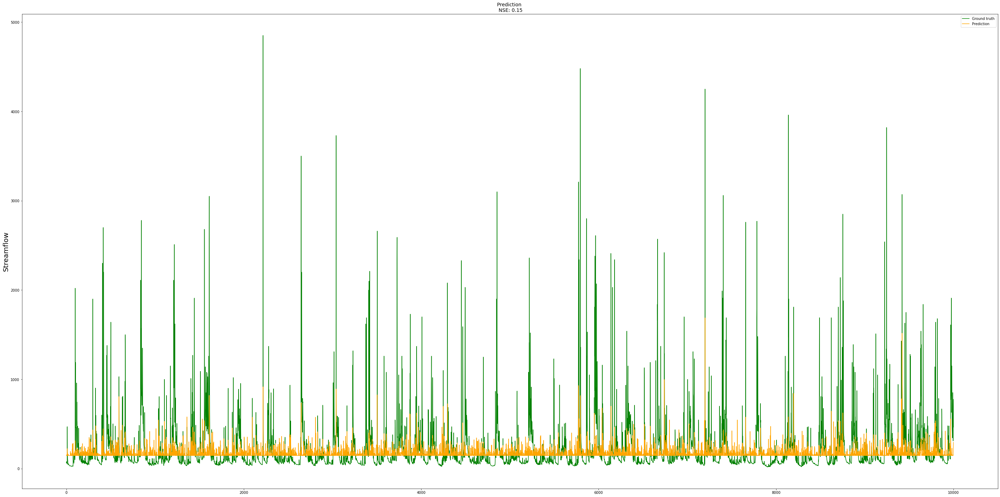

In [482]:
#15 with [prcp] and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

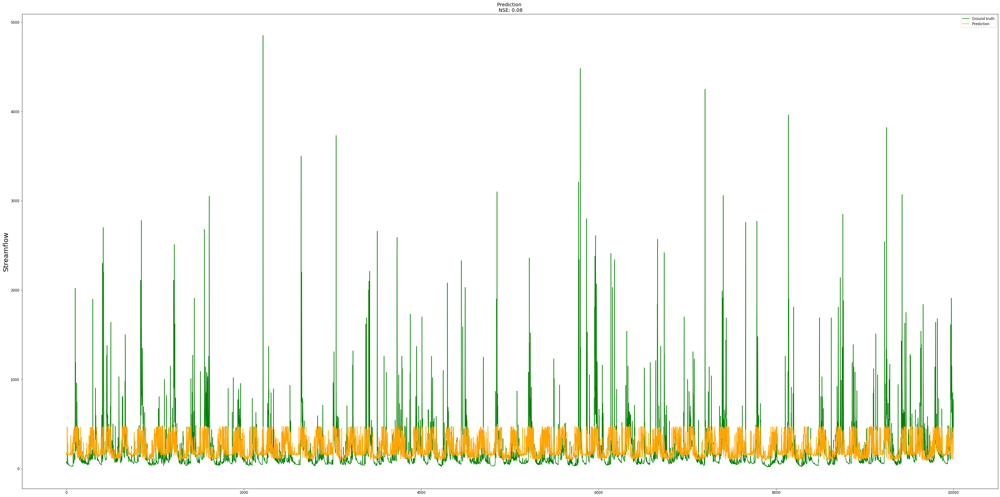

In [548]:
#15 with [tmax] and without [prcp,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

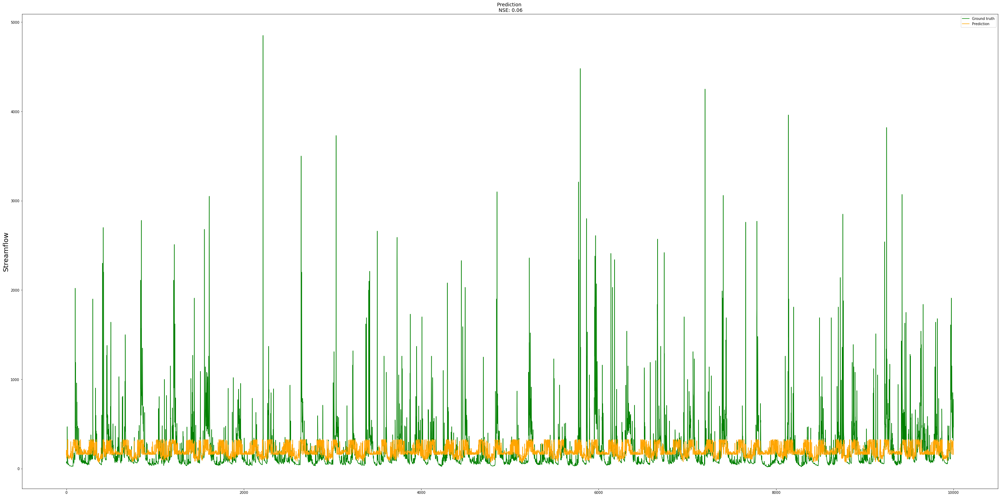

In [581]:
#15 with [tmin] and without [tmax,prcp,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

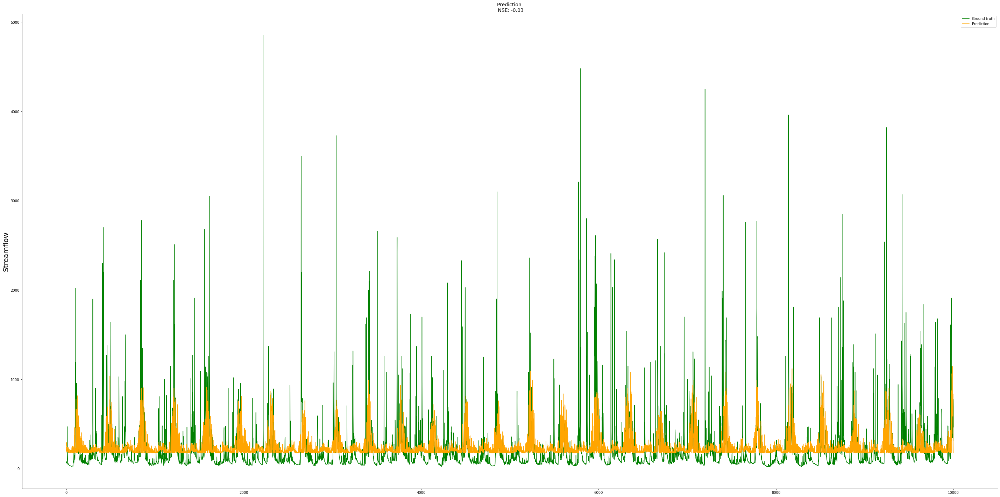

In [515]:
#15 with [srad] and without [tmax,prcp,vpL,tmin]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()


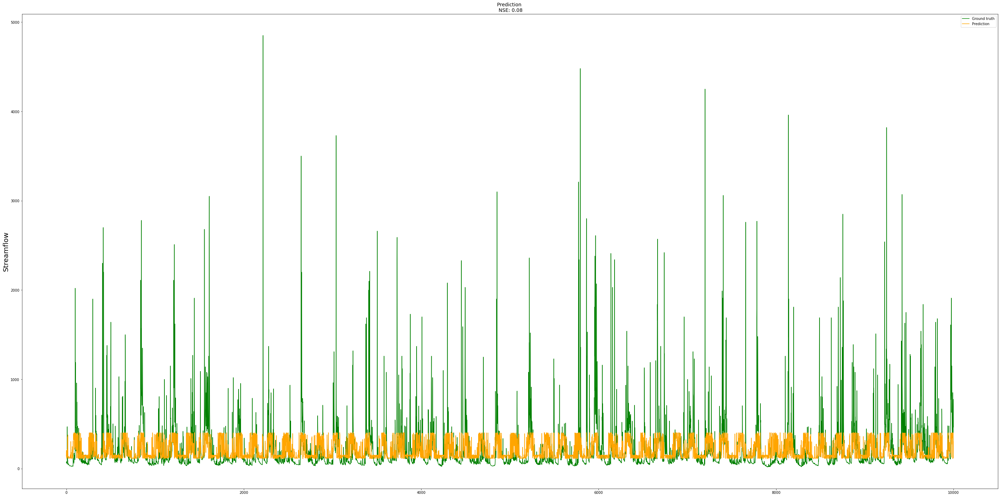

In [949]:
#15 with [vpL] and without [tmax,prcp,srad,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

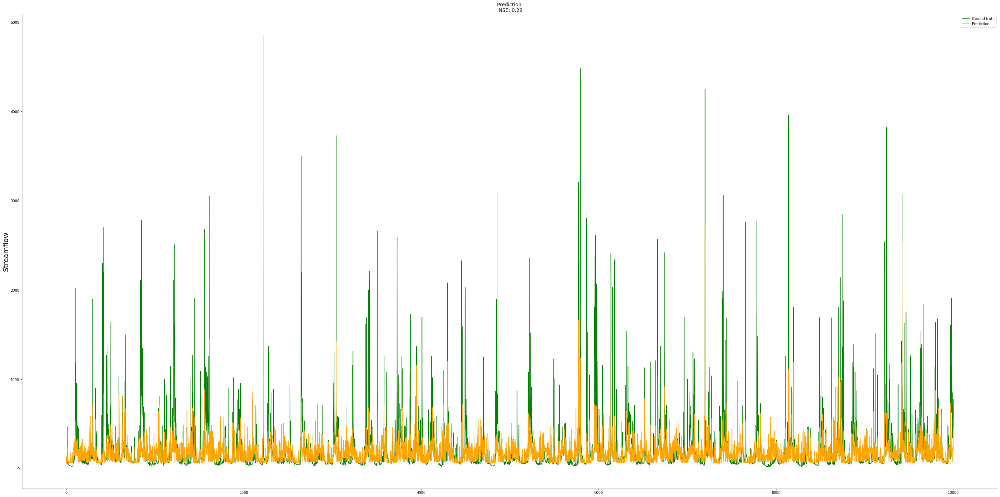

In [916]:
#15 with [prcp,vpL] and without [tmax,srad,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

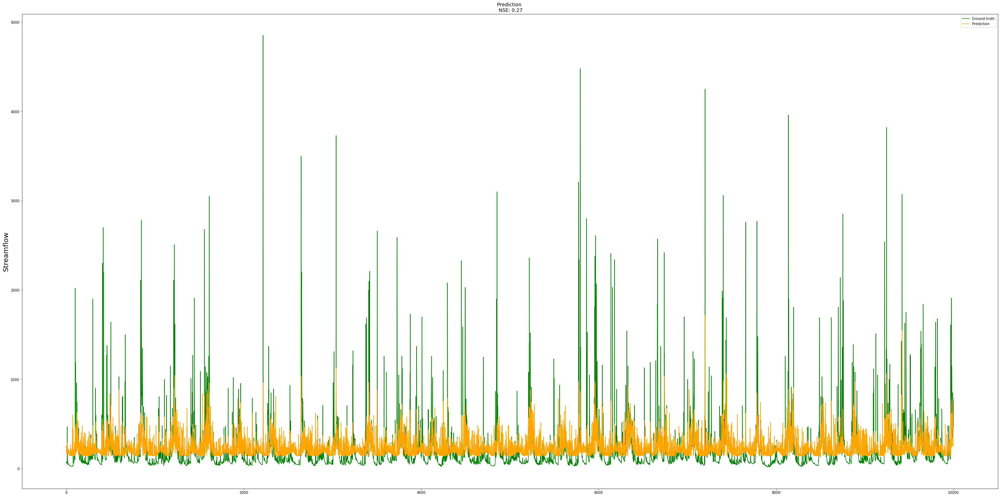

In [619]:
#15 with [prcp,srad] and without [tmax,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

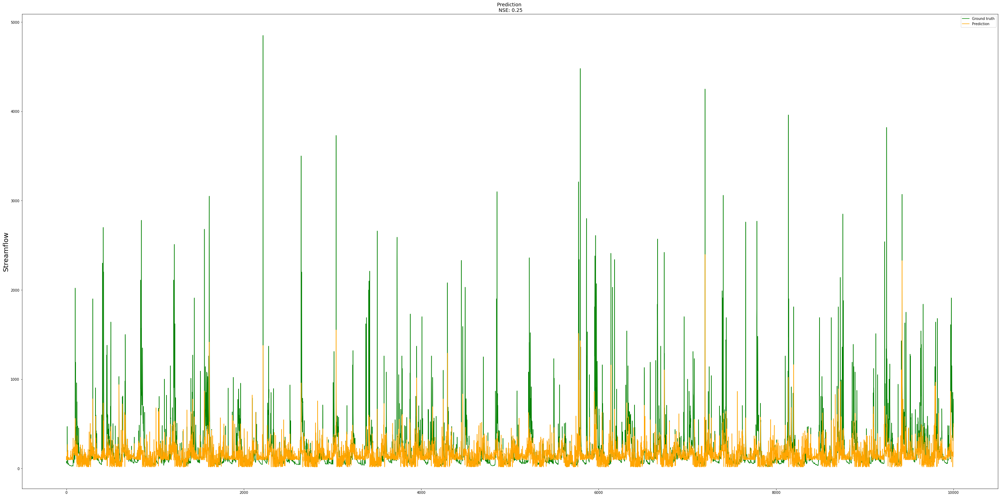

In [685]:
#15 with [prcp,tmin] and without [tmax,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

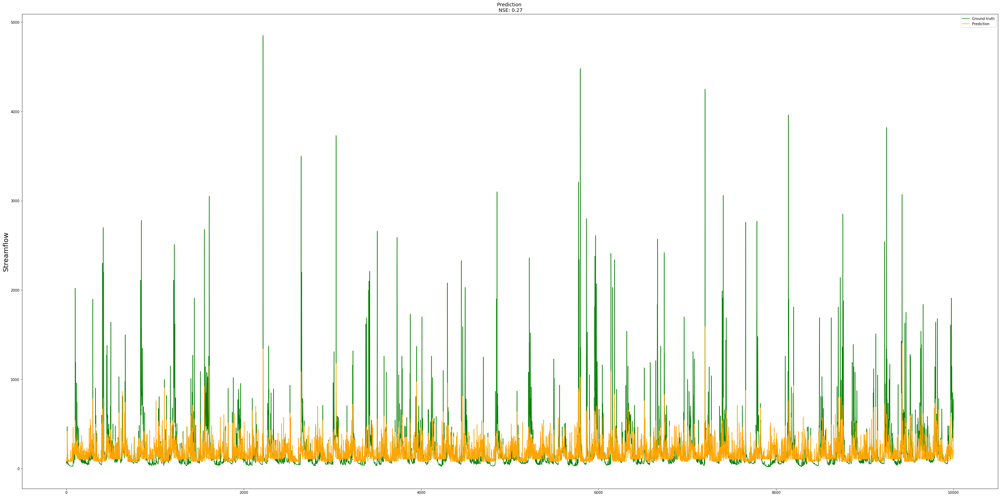

In [652]:
#15 with [prcp,tmax] and without [srad,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)0


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

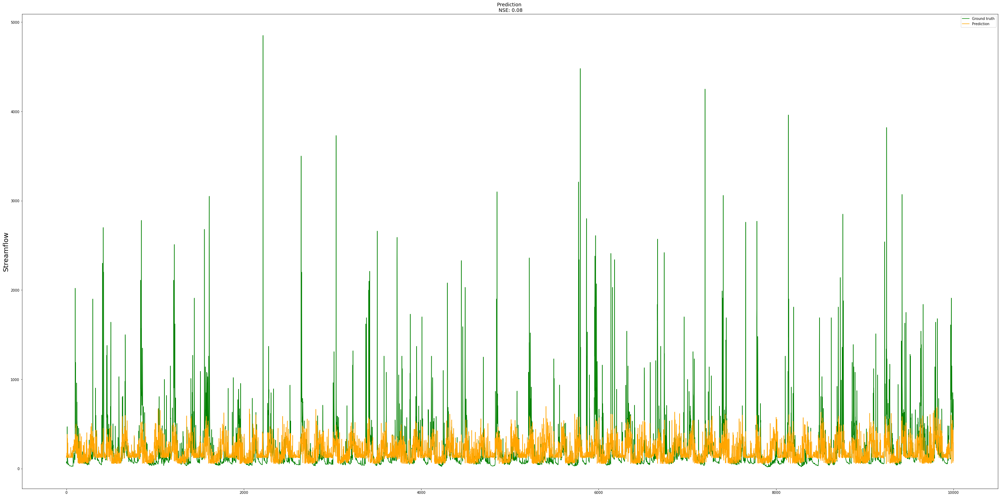

In [718]:
#15 with [srad,tmax] and without [tmax,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

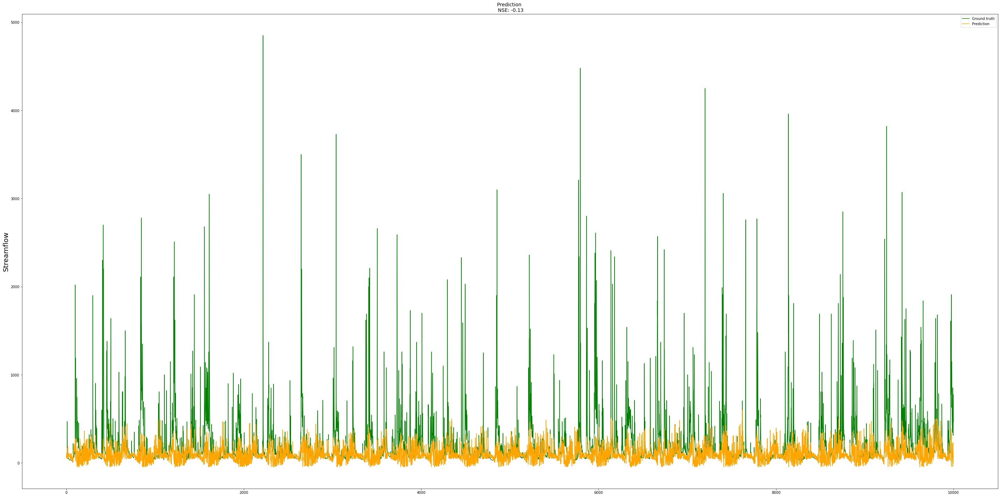

In [751]:
#15 with [srad,tmin] and without [tmax,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

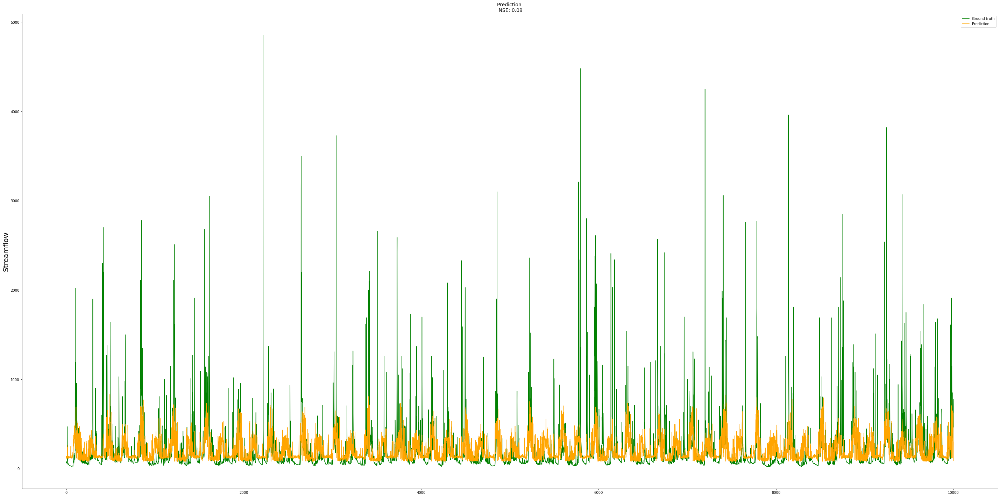

In [784]:
#15 with [srad,vpL] and without [tmax,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

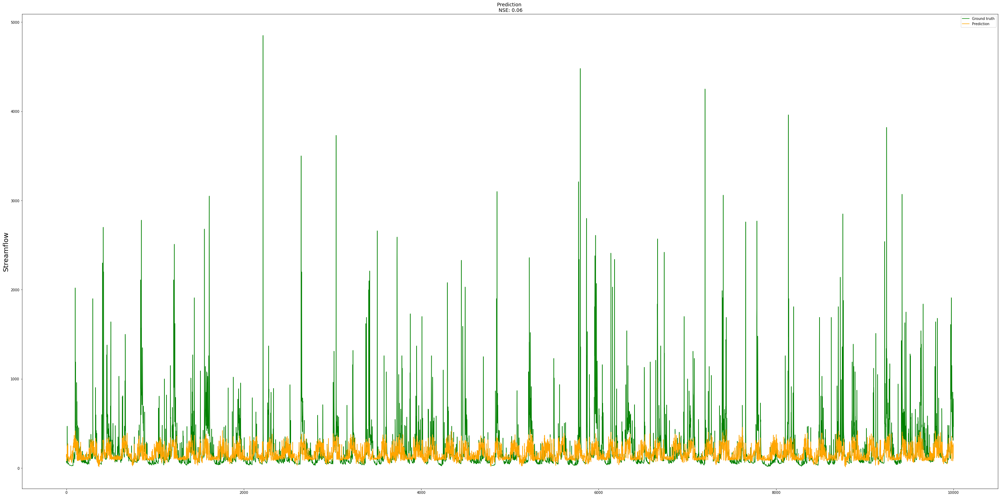

In [817]:
#15 with [tmax,tmin] and without [tmax,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

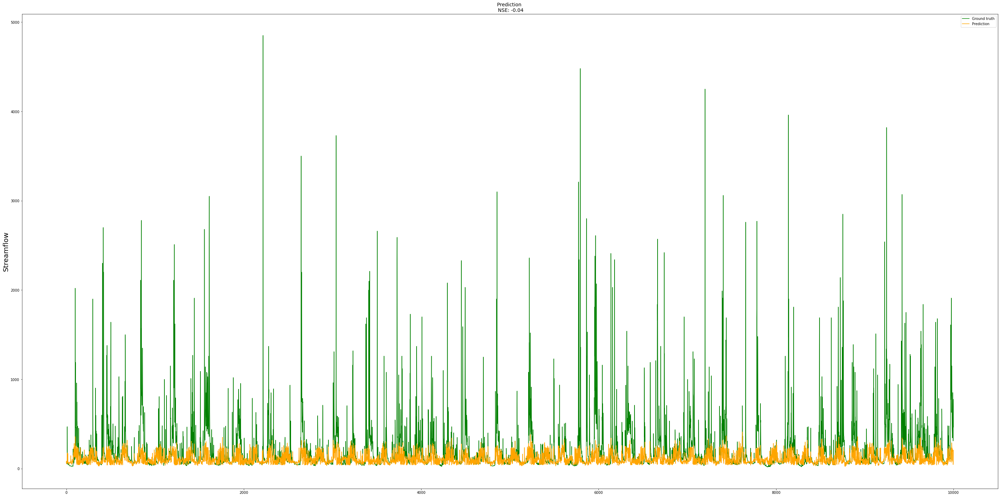

In [850]:
#15 with [tmax,vpL] and without [tmax,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

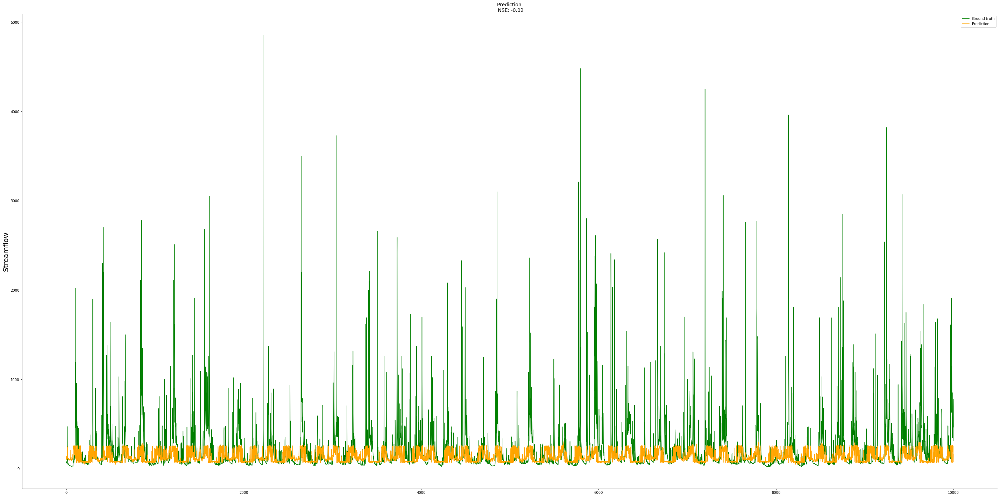

In [883]:
#15 with [tmin,vpL] and without [tmax,vpL,tmin]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

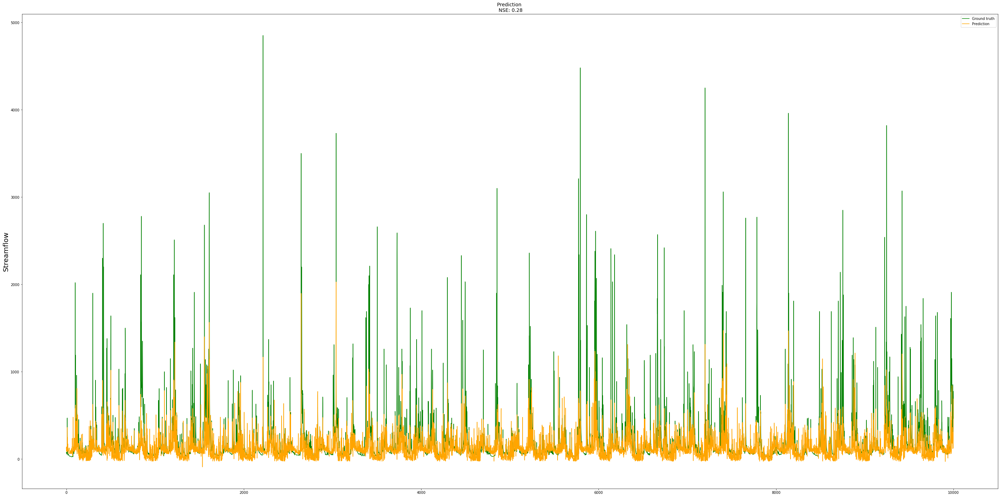

In [982]:
#15 with [prcp,srad,tmax]and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

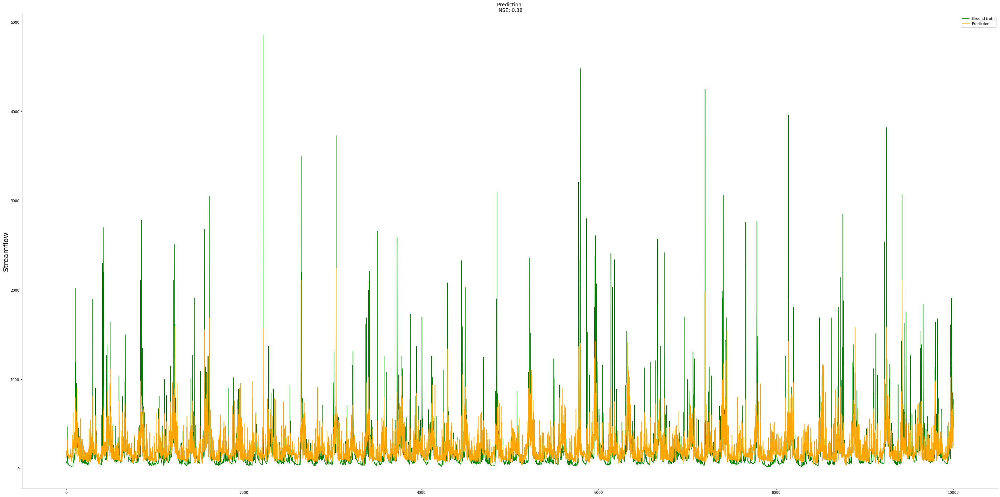

In [1015]:
#15 with [prcp,srad,tmin] and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

Text(0.5, 1.0, 'Prediction \n NSE: 0.28')

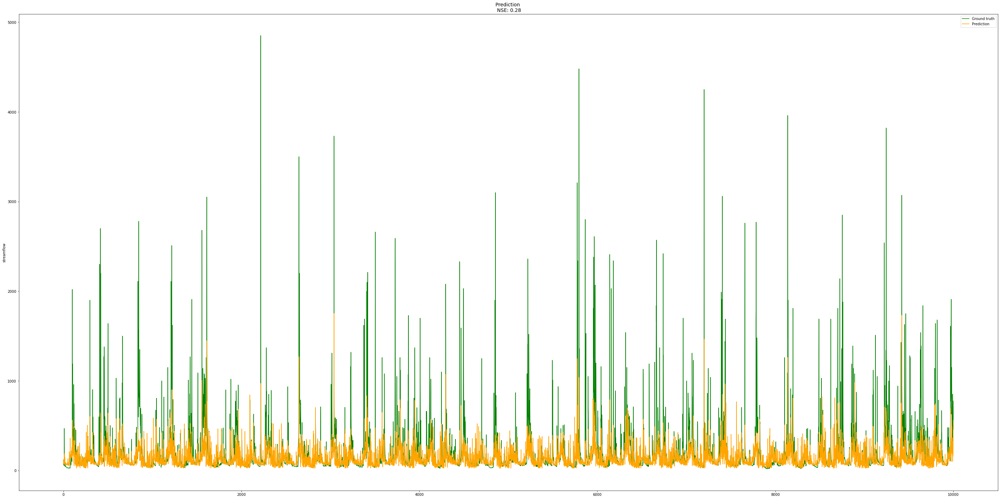

In [1544]:
#15 with [prcp,srad,vpL] and with root_depth

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)

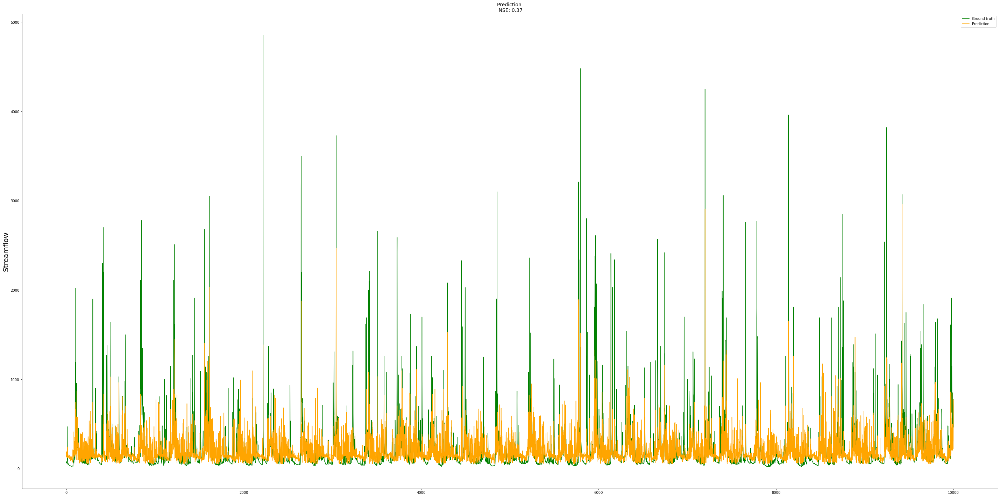

In [1511]:
#15 with [prcp,srad,vpL] and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

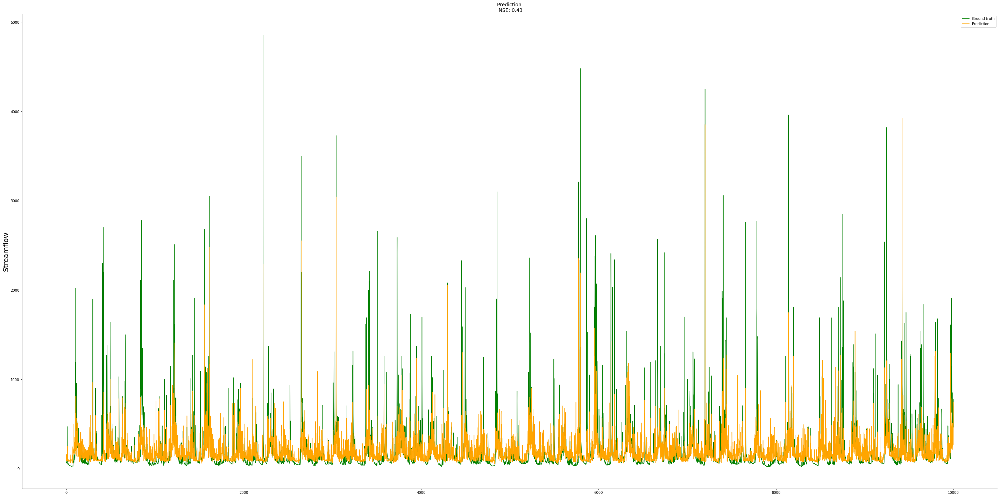

In [1048]:
#15 with [prcp,srad,vpL] and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

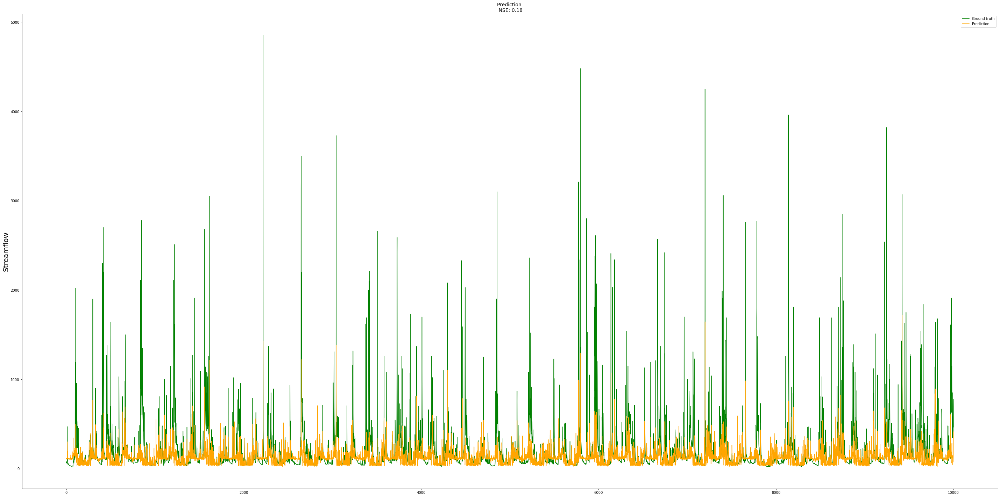

In [1081]:
#15 with [prcp,tmax,tmin] and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

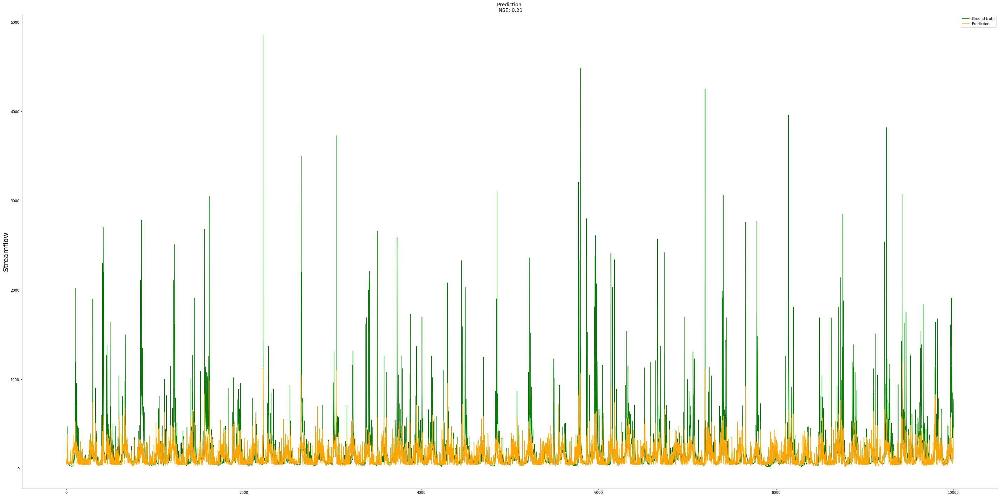

In [1114]:
#15 with [prcp,tmax,vpL] and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

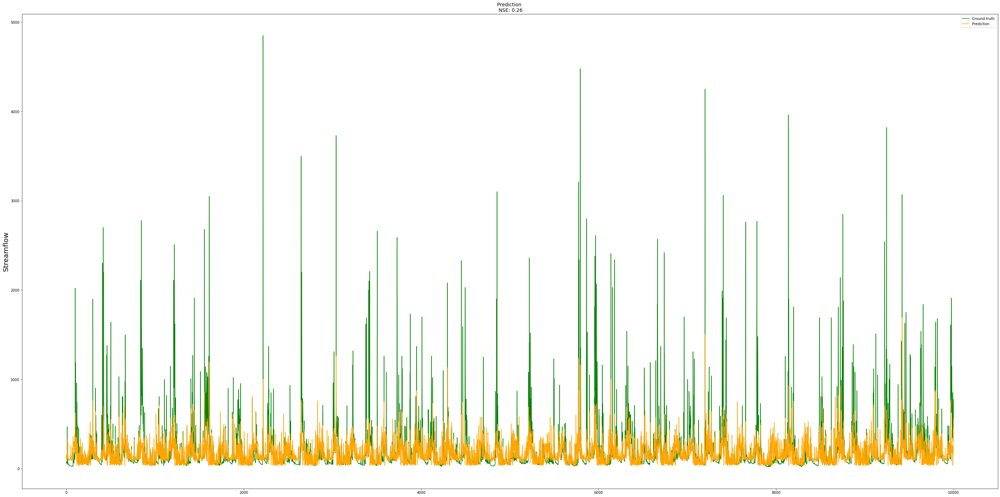

In [1147]:
#15 with [prcp,tmin,vpL] and without [tmax,tmin,vpL,srad]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

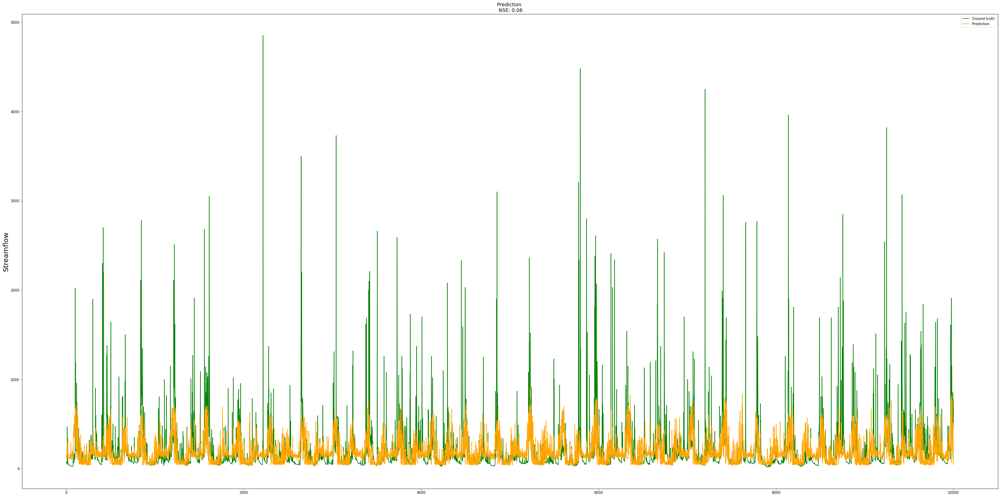

In [1180]:
#15 with [srad,tmax,tmin]and without [tmax,tmin,vpL,srad]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

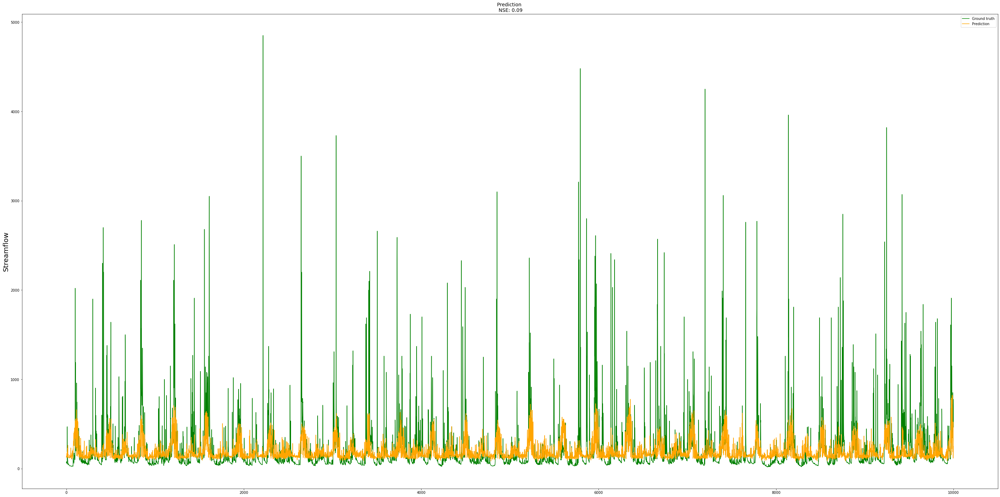

In [1213]:
#15 with [srad,tmax,vpL]and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

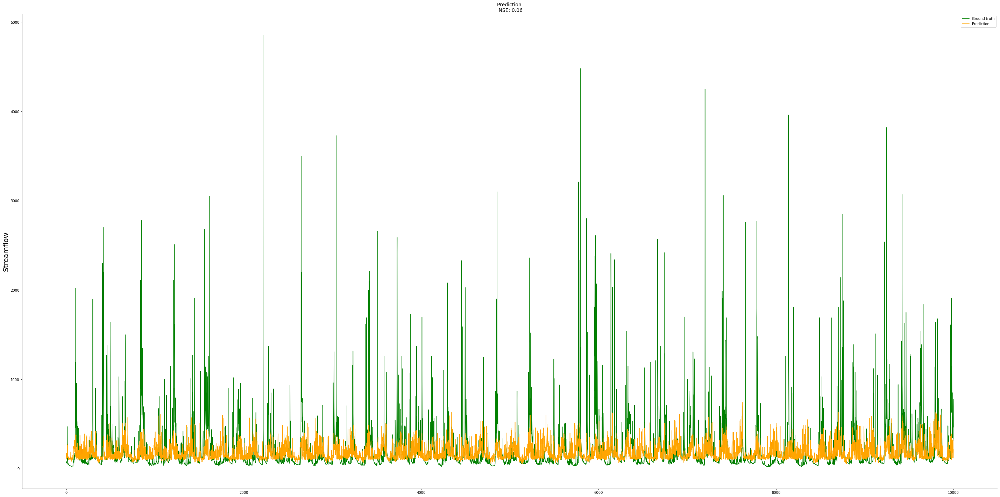

In [1246]:
#15 with [srad,tmin,vpL]and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

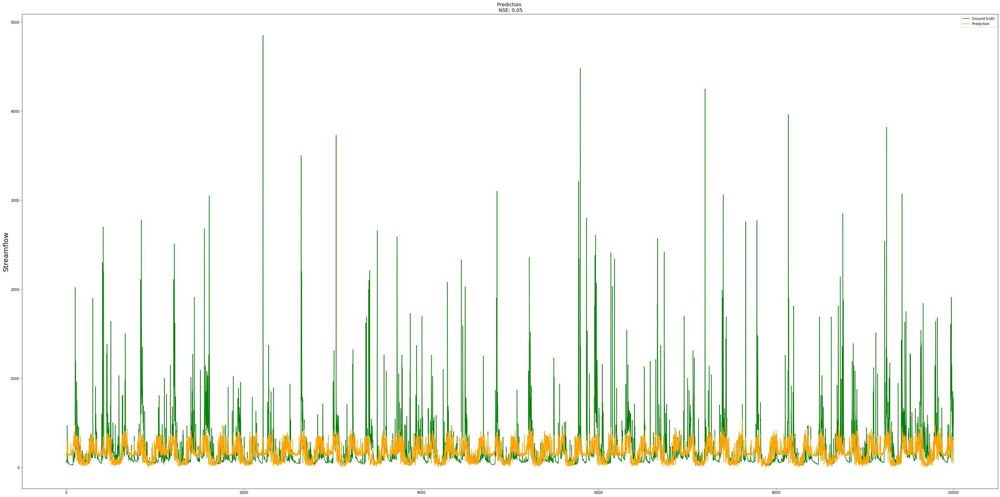

In [1279]:
#15 with [tmax,tmin,vpL]and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

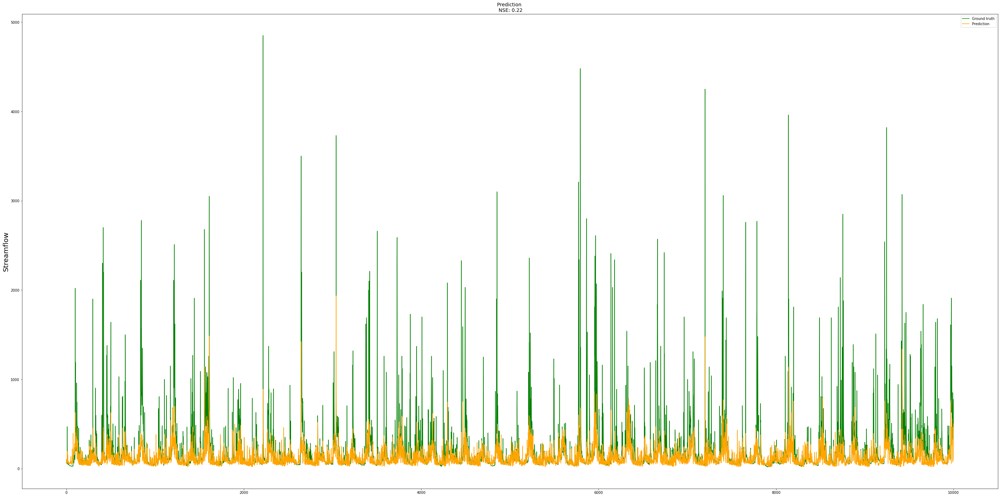

In [1577]:
#15 with [prcp,srad,tmax,tmin]and without [tmax,tmin,vpL,srad] with root_depth

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

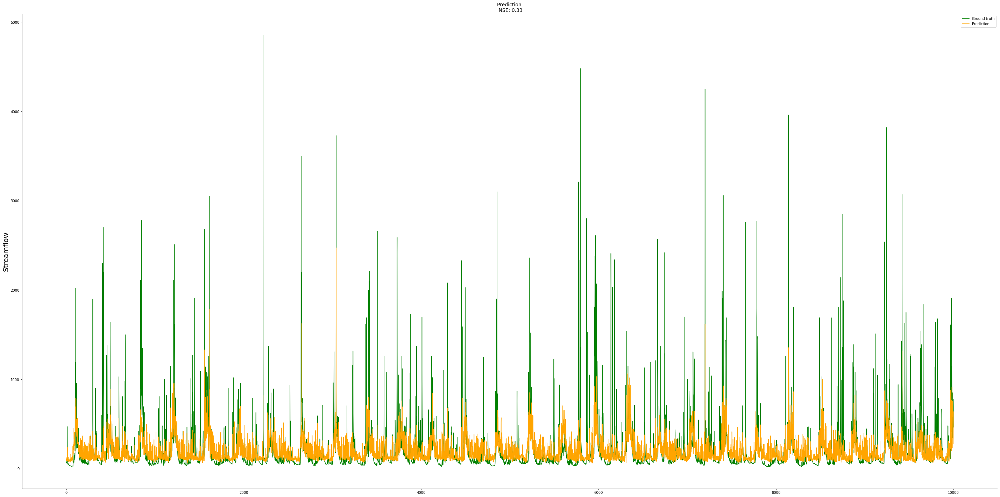

In [1478]:
#15 with [prcp,srad,tmax,tmin]and without [tmax,tmin,vpL,srad]

y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

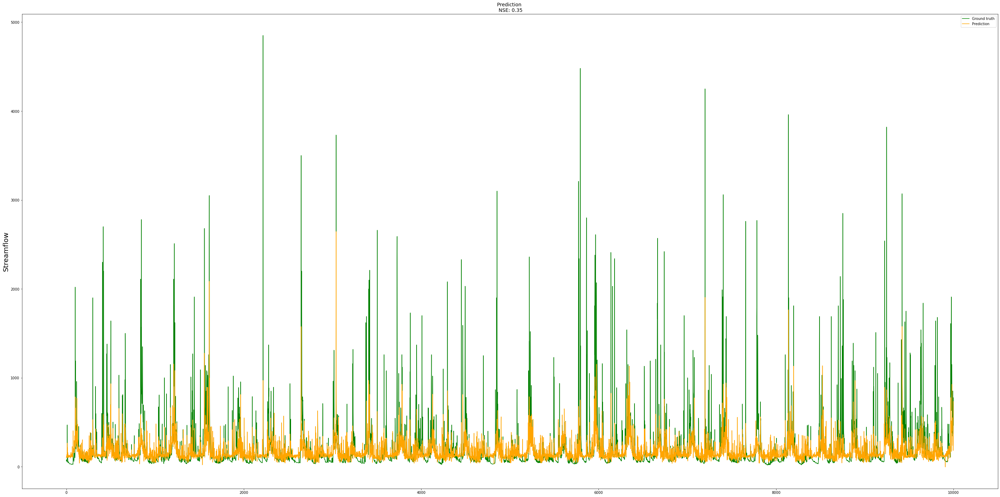

In [1345]:
#15 with [prcp,srad,tmax,vpL]and without [tmax,tmin,vpL,srad]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

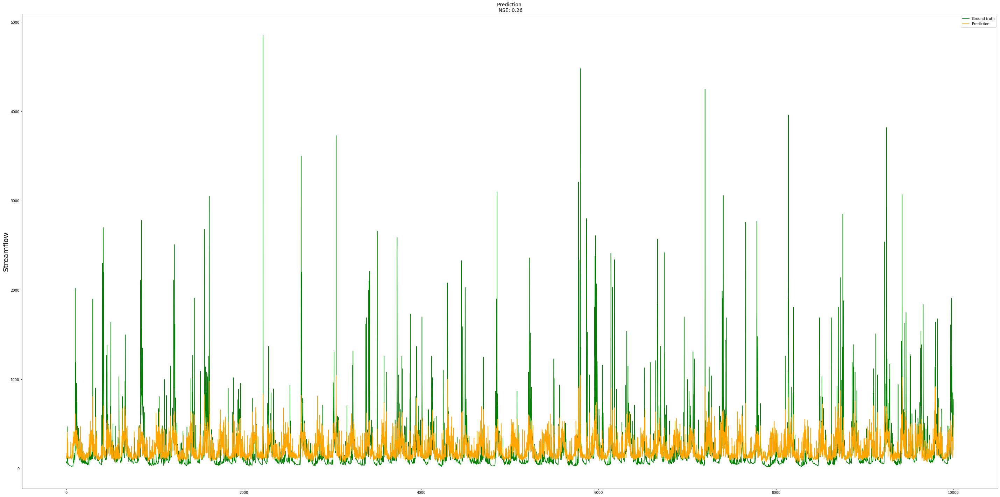

In [1378]:
#15 with [prcp,tmax,tmin,vpL]and without [tmax,tmin,vpL,srad]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

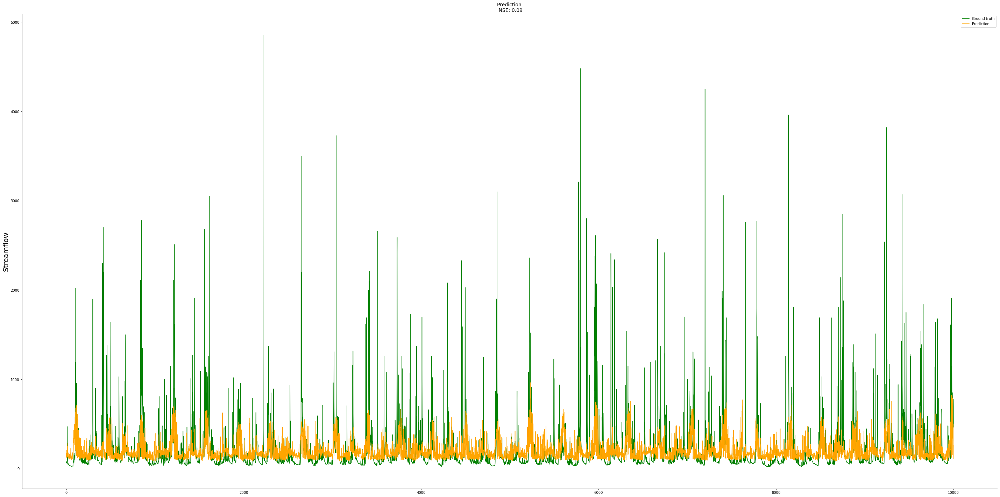

In [1411]:
#15 with [srad,tmax,tmin,vpL]and without [tmax,tmin,vpL,srad]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

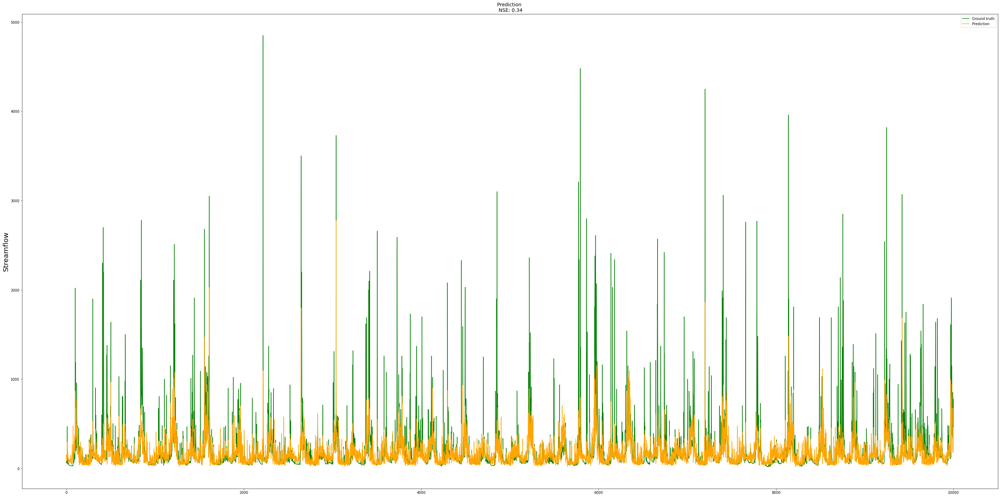

In [1445]:
#15 with [prcp,srad,tmax,tmin,vpL]and without [tmax,tmin,vpL,srad]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

In [ ]:
# with root depth []

In [ ]:
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

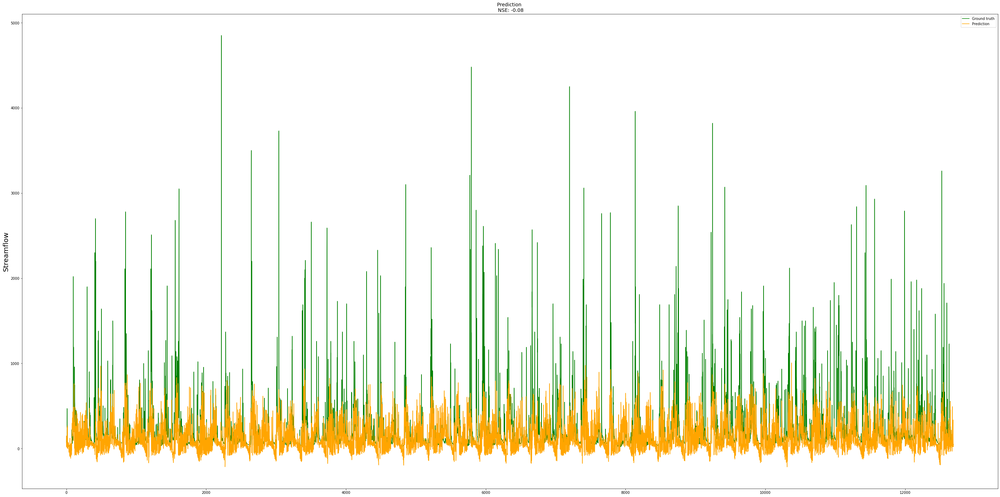

In [320]:
#15 with [srad,vpL] and without [tmax,tmin,prcp]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

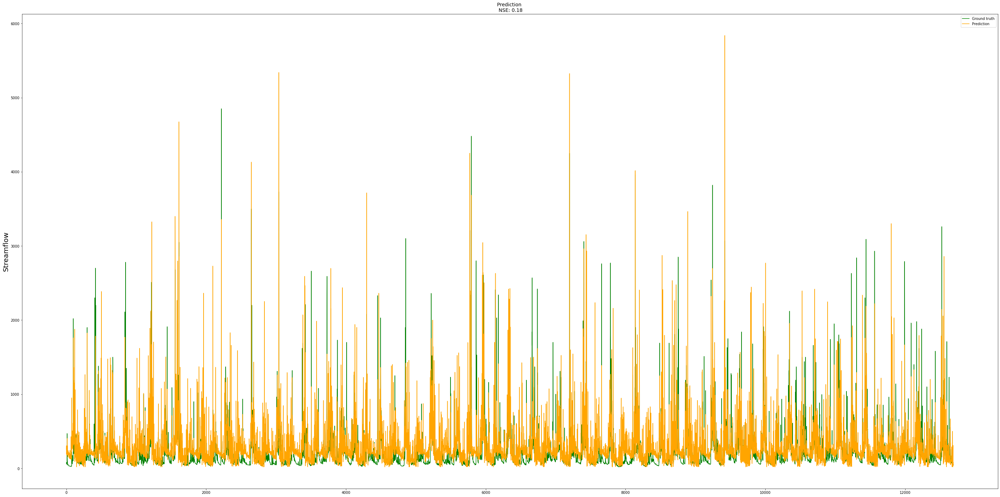

In [287]:
#15 with [srad,vpL,prcp] and without [tmax,tmin]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

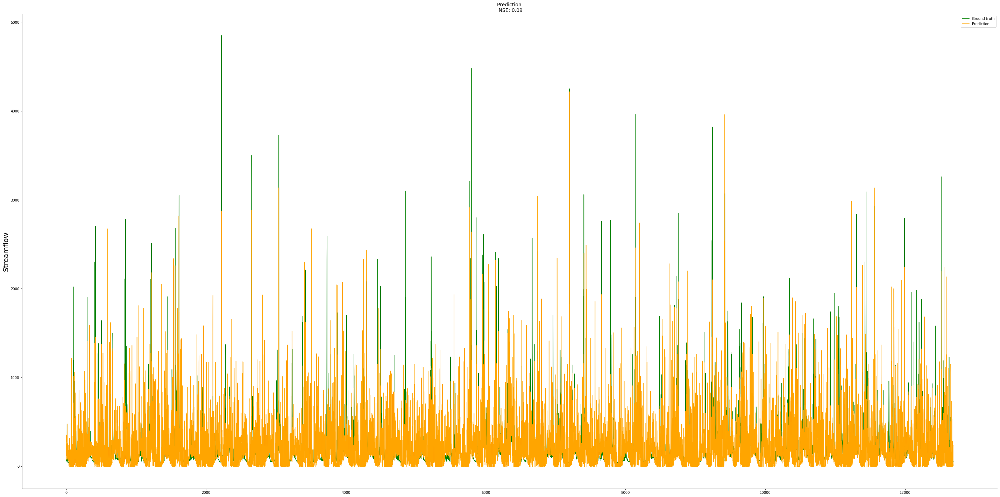

In [253]:
#15 with [srad,prcp] and without [vpl,tmax,tmin]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

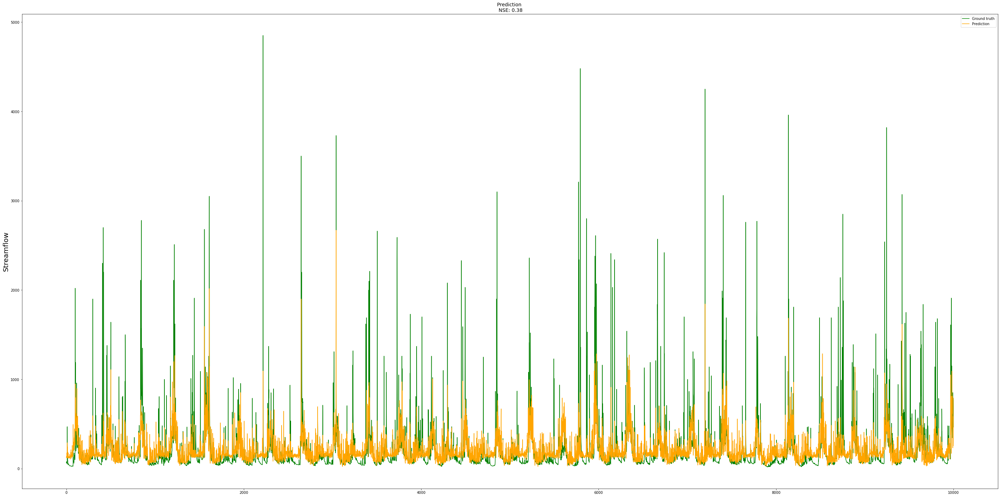

In [400]:
#15 with [tmax,tmin,prcp,srad,vpL] 
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

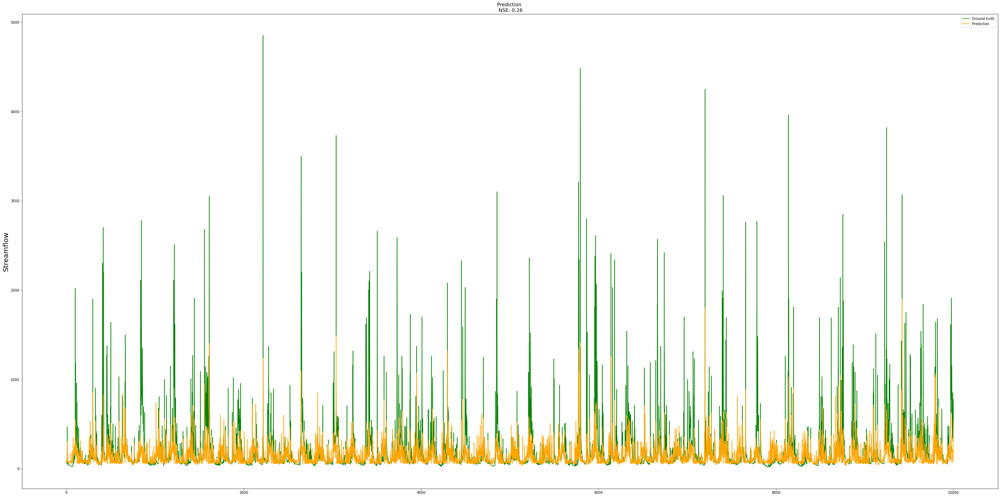

In [177]:
#15 with [tmax,tmin,prcp,vpl] and without [srad]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

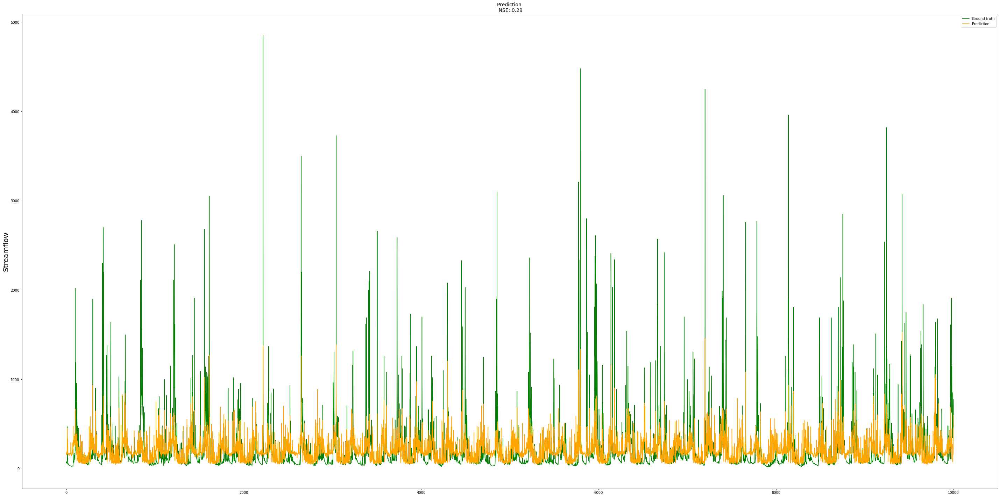

In [126]:
#15 with [tmax,tmin,prcp] and without [srad,vpL]
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()

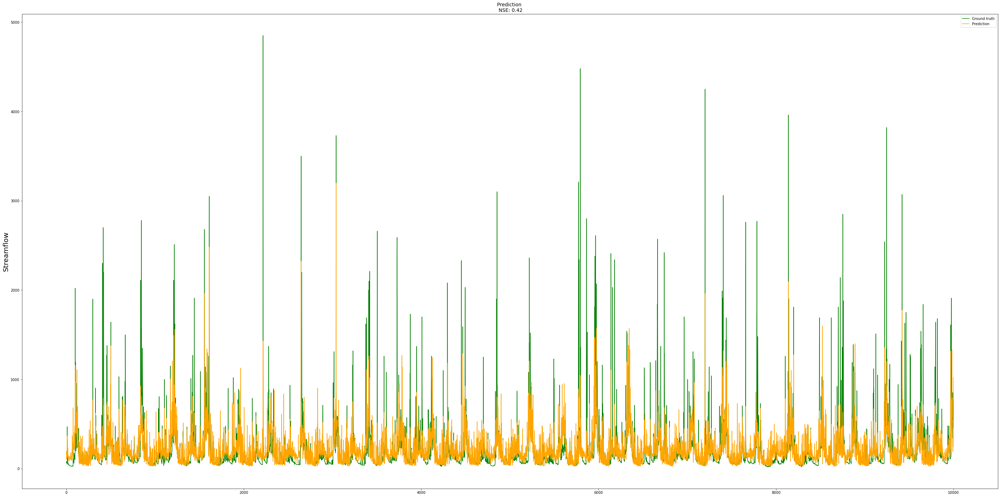

In [92]:
#15 with [srad,tmax,tmin,prcp] and without vpL
y_train = fully_final['streamflow']
x_test_ticks = fully_final['streamflow_pred']
x_date = []

for i in range(0,y_obs.shape[0]+1):
    x_date.append(i)

# Plot the forecast
f, ax = plt.subplots(1)
f.set_figheight(25)
f.set_figwidth(50)


sns.lineplot(x=x_date, y=fully_final['streamflow'], ax=ax, color='green', label='Ground truth') #navajowhite
sns.lineplot(x=x_date, y=fully_final['streamflow_pred'], ax=ax, color='orange', label='Prediction') #navajowhite
ax.set_title(f'Prediction \n NSE: {nse_val:.2f}', fontsize=14)


ax.set_ylabel(ylabel='Streamflow', fontsize=20)

plt.show()